EDA and Data Visualization using Breast Cancer Dataset:
I`ve tried to do below,

- Exploratory Data Anlysis on the Dataset (1,2,3,4)
- Data Visualization using Python (5,6,7,8,9)
- Inference from EDA and Data Visualization

In [1]:
import pandas as pd 
import numpy as np 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
breast_cancer_data = pd.read_csv('cancer_data.csv')

1. This step is to understand the different features in the dataset .
- checking the head() to display first 5 records in the df
-checking the shape to see how many datasets(569) and features(32) are present .

In [4]:
breast_cancer_data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [5]:
breast_cancer_data.shape

(569, 33)

2. Next step is to check the data present 

In [6]:
breast_cancer_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [7]:
#Checking the distribution of the dataset based on the target variable to see if there is an imbalance:
breast_cancer_data['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

3. Encoding the labels for classification problem :Encode the Diagnosis column in numerical format , assign B -0 , M -1

In [8]:
label_encode = LabelEncoder()
labels = label_encode.fit_transform(breast_cancer_data['diagnosis'])
breast_cancer_data['target'] = labels
breast_cancer_data.drop(columns=['id','diagnosis'], axis=1,    inplace=True)

4.  Checking missing values and data analysis

In [10]:
breast_cancer_data.isnull().sum()
# So no missing data 

radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed: 32                569
target                       0
dtype: i

In [11]:
breast_cancer_data['target'].value_counts()

0    357
1    212
Name: target, dtype: int64

In [12]:
#This step is also exclusive for Classification problems. This is to group the dataset based on the target variable. 
# We will be grouping the data points as 0 & 1 representing Benign & Malignant respectively. 
# --[==]]]]]]-09tredsxcfghyuygtfrgvbhgtfrgvbgtgfcft5`    ` grouping is done with the mean value of all the columns.
breast_cancer_data.groupby('target').mean()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
target,,,,,,,,,,,,,,,,,,,,,
0,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,0.062867,...,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442,NaN
1,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,0.062680,...,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530,NaN


After EDA , i`m trying to do some Data visualization using Python as its easier to understand the data visually

#5. Count plot for Categorical columns:

<AxesSubplot:xlabel='target', ylabel='count'>

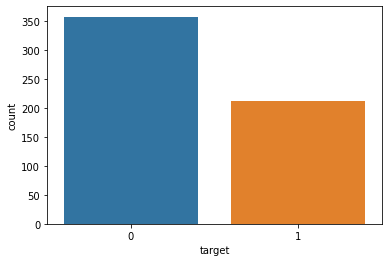

In [13]:
sns.countplot(x= 'target', data=breast_cancer_data)

Inference :
The number of data points with label “0” is higher than label “1”. 
This means that we have more Benign cases compared to Malignant cases in the dataset. 
So we can say that this dataset is slightly imbalanced. 
Count plot will show the total counts in each category.

/Users/vrinda/opt/anaconda3/envs/py3_10/lib/python3.10/site-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


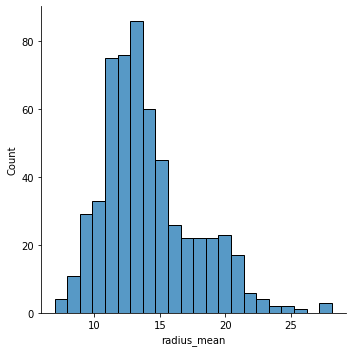

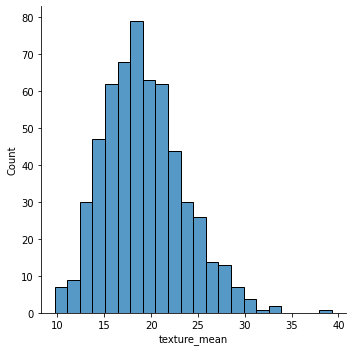

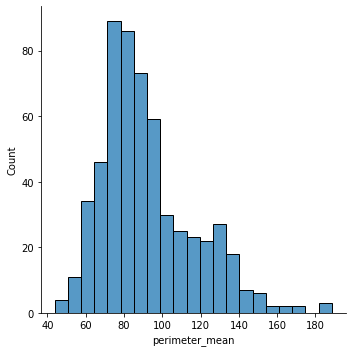

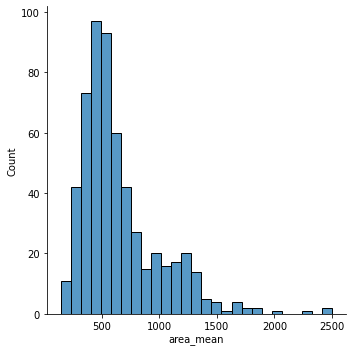

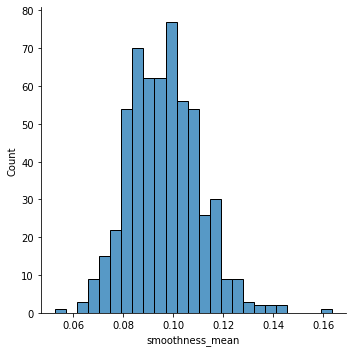

...

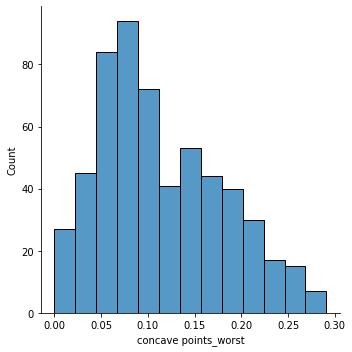

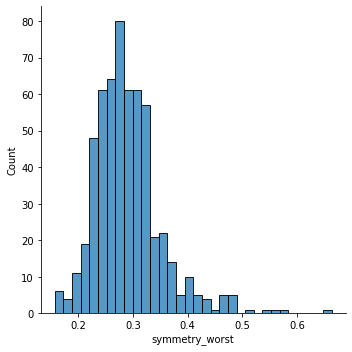

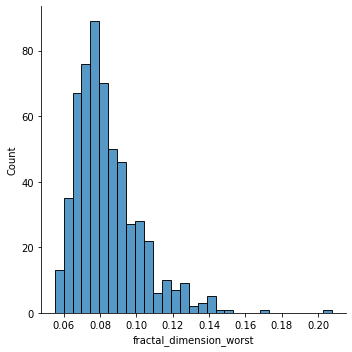

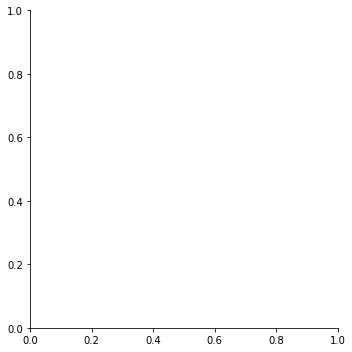

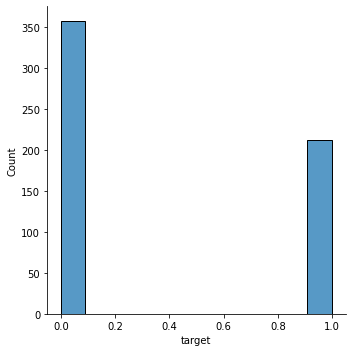

In [14]:
#6. Distribution plot for all columns:
#this is called Univariate anlysis as we take one variable at a time and chck relationship between them.
for col in breast_cancer_data:
    sns.displot(x=col, data=breast_cancer_data)

Note :When the skewness in the data is large, we may need to do some transformations, in order to get better results from the Machine Learning models once we train them.

7. Pair plot:
A pair plot gives pairwise relationships in a dataset.

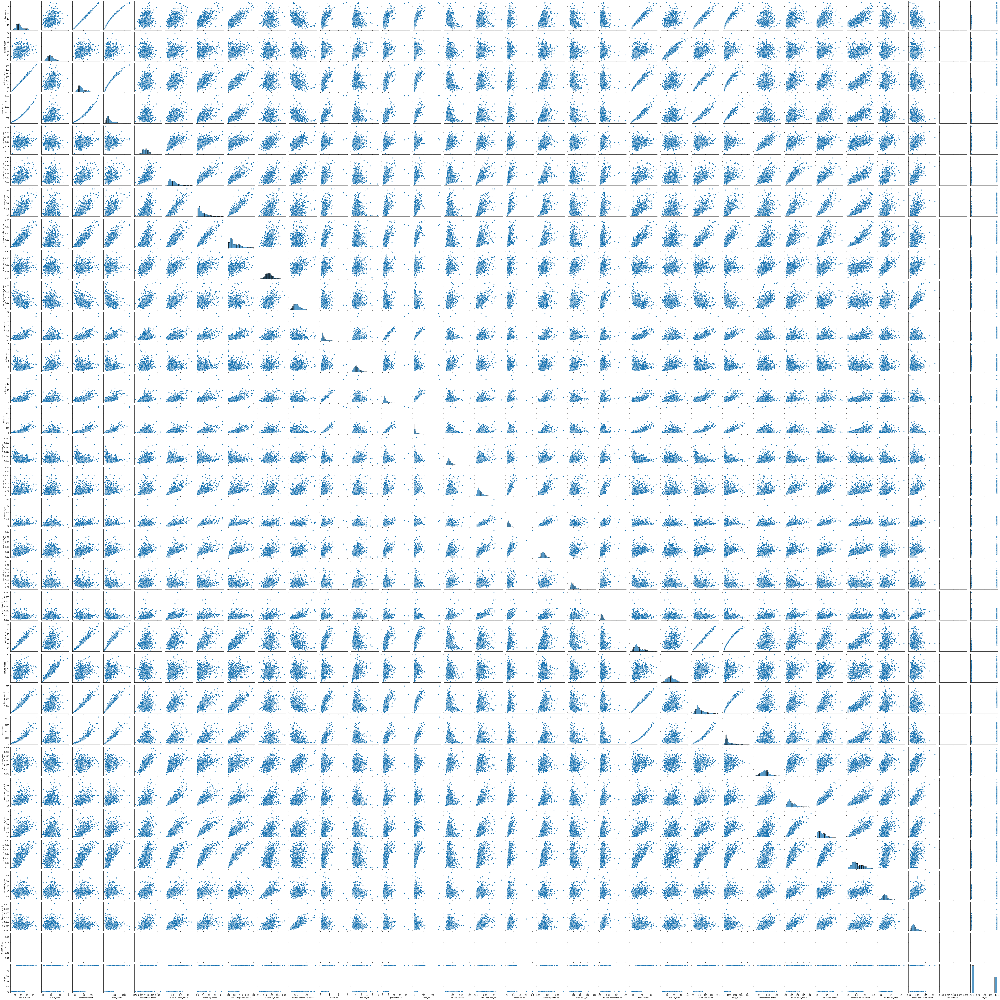

In [15]:
sns.pairplot(breast_cancer_data)

8. checking for outliers:
-Outliers detection is one of the important tasks that we have to do.
-Machine Learning models like Regression models, K-Nearest Neighbors, etc. are sensitive to outliers. 
-Models like Random Forest are not affected by Outliers. So we should process these outliers before feeding the data to those models.
- Box plot or whisker plot are good for checking outliers

/var/folders/8y/s4q4z6k56mg49b_fkzjn68dm0000gn/T/ipykernel_69496/3155282892.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


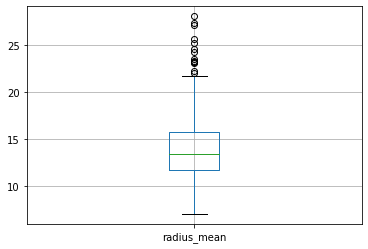

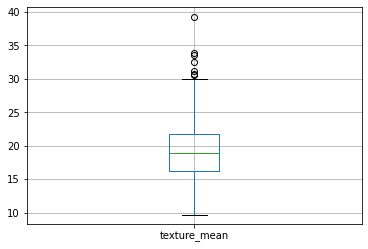

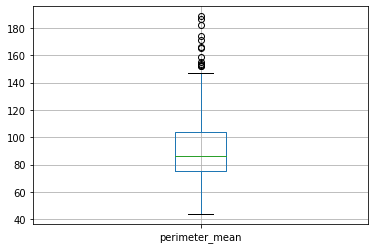

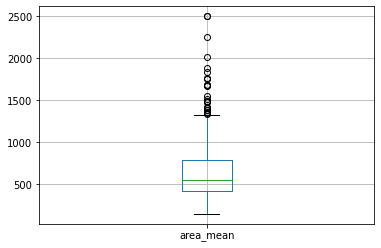

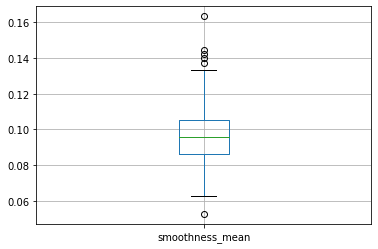

...

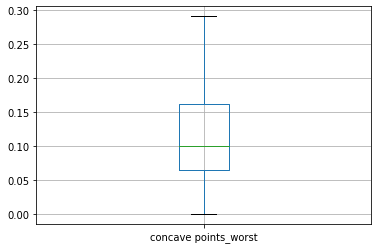

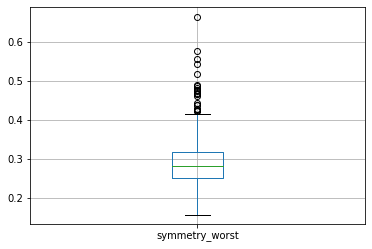

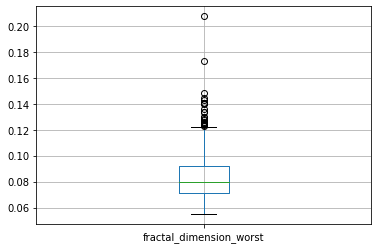

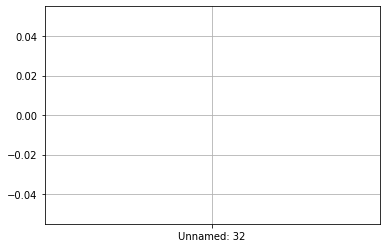

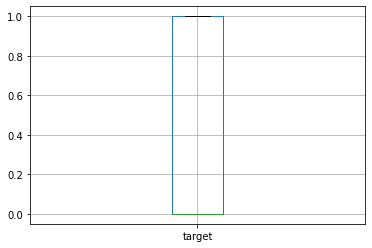

In [16]:
for column in breast_cancer_data:
   plt.figure()
   breast_cancer_data.boxplot([column])


9. Correlation matrix:
The main purpose of a correlation matrix is to understand the correlation (in other words, relationship) between the variables present in a dataset. 
It is very helpful in Feature Selection which is carried out to choose the important features and remove the irrelevant and unnecessary features.

- Correlation values ranges from +1 to -1 .  +1 - +ve correlation , -1 is _ve correlation
- When we have two independent variables that are very highly correlated, we should remove one of them because we run into the multicollinearity problem.

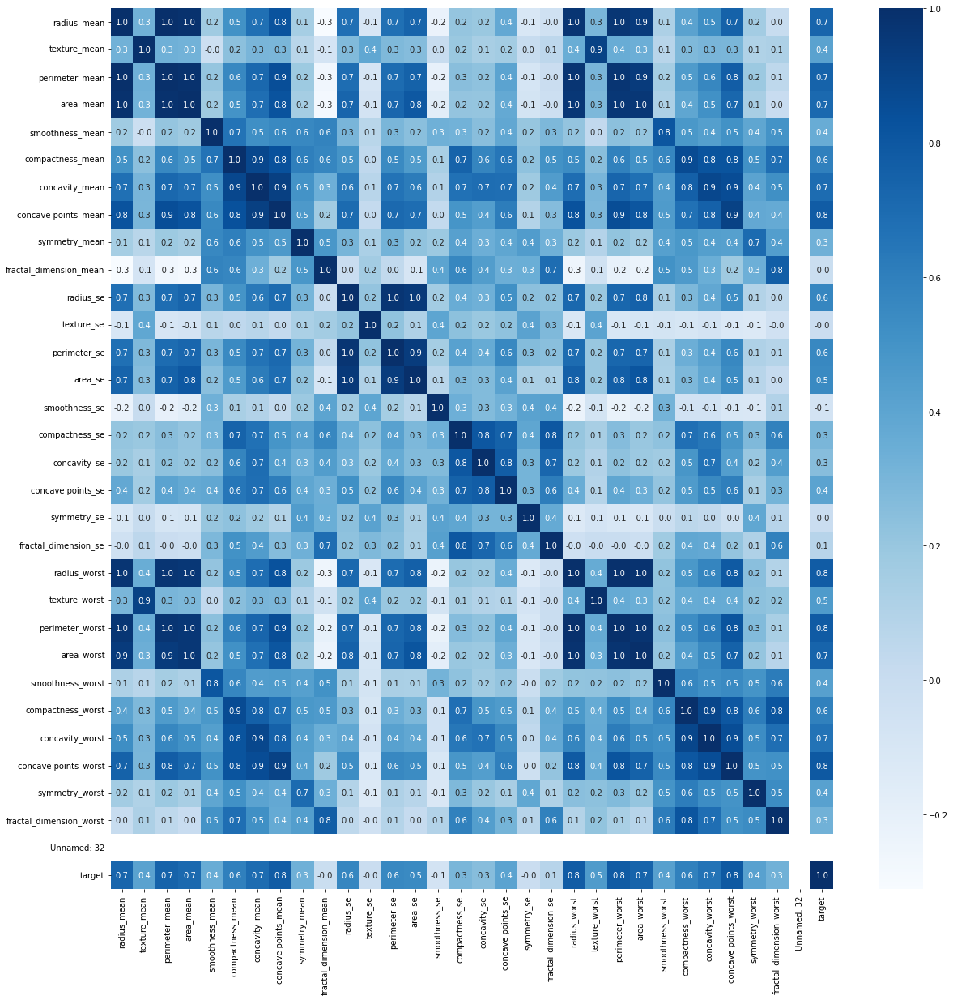

In [17]:
correlation_matrix = breast_cancer_data.corr()
plt.figure(figsize=(20,20))
sns.heatmap(correlation_matrix, cbar=True, fmt='.1f', annot=True, cmap='Blues')
plt.savefig('Correlation Heat map')

10. Inference from EDA & Data Visualization:

No missing Values in the dataset.

All variables have continuous numerical values except for Target column.

Mean is slightly more than the median for most of the features. So it is right skewed. This is visible through the distribution plots.

Slight imbalance in the dataset (Benign(0) cases are more than Malignant(1) cases). Refer Count Plot.

Mean of most features are clearly larger for Malignant cases compared to the benign cases (Groupby).

Most of the features have Outliers.

Correlation Matrix reveal that most of the features are highly correlated. So we can remove certain features during Feature Selection.

